# Medical Appointment Analysis

In this notebook we will try to analyze why would some patient not show up for his medical appointment and whether there are reasons for that using the data we have.
We will try to find some correlation between the different attributes we have and whether the patient shows up or not. The dataset we are going to use contains 110.527 medical appointments and its 14 associated variables ( PatientId, AppointmentID, Gender, ScheduledDay, AppointmentDay, Age, Neighbourhood, Scholarship, Hypertension, Diabetes, Alcoholism, Handcap', SMS_received, No-show )

### Questions to answer

*   What is the percentage of no-show?
*   What factors are important for us to know in order to predict if a patient will show up for their scheduled appointment?
    *   Is the time gender related to whether a patient will show or not?
    *   Are patients with scholarship more likely to miss their appointment?
    *   Are patients who don't recieve sms more likely to miss their appointment?
    *   Is the time difference between the scheduling and appointment related to whether a patient will show?
    *   Does age affect whether a patient will show up or not?
    *   What is the percentage of patients missing their appointments for every neighbourhood


## Setup

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.express as px
#choose plots style
sns.set_style('darkgrid')
#make sure plots are inline with the notebook
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Defined functions

In [3]:
def add_assistance_percentage_per_indicator(df, indicator):
    # Define column name
    col_name = "Total "+indicator+" appointments"

    # Add a column for the total appointmens per indicator class to get the percentage
    df[col_name] = df[indicator].map(dict(df.groupby([indicator])["Assistance"].sum()))

    # Add a column representing the percentage of assistance to the apointment
    df["Percentage of appointments"] = (df["Assistance"] * 100 ) / df[col_name].astype(float)

    return df

In [4]:
def plot_missing_assistance_percentage_per_indicator(df, indicator, title):

    # Plot appointments missing rate by scholarship class
    days = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]

    fig = px.bar(df[df["Assisted"] == False ],
                title =title,
                color=indicator, y="Percentage of appointments", x=indicator,
                labels = {
                    "Percentage of appointments" : "Percentage of missed appointments (%)"
                },
                category_orders={
                    indicator: days
                },
                text_auto=".4s")

    # Set values over the bars
    fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

    # Hide legend
    fig.update_layout(showlegend=False)

    fig.show()

In [5]:
import seaborn as sns

def plot_confusion_matrix(cm, title="Confusion Matrix"):
    plt.figure(figsize=(6,6))
    sns.set(font_scale=1.5)
    ax = sns.heatmap(cm, annot=True, annot_kws={"size":16}, fmt='g', cmap='Blues', cbar=False)

    ax.set_xlabel("Predicted values")
    ax.xaxis.set_ticklabels(['Negative','Positive'])

    ax.set_ylabel("Actual values")
    ax.yaxis.set_ticklabels(['Negative','Positive'])

    ax.set_title(title)

In [6]:
from sklearn.metrics import roc_curve, auc

def plot_roc_curve(x_test, y_test, model):

    y_score = model.predict_proba(x_test)[:, 1]

    fpr, tpr, thresholds = roc_curve(y_test, y_score)

    fig = px.area(
        x=fpr, y=tpr,
        title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
        labels=dict(x='False Positive Rate', y='True Positive Rate'),
        width=700, height=500
    )

    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    fig.show()

# Data Wrangling

### Loading the dataset and checking the columns we have


In [7]:
df = pd.read_csv('Datasets/medical_appointment_2016.csv')
df.head()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
0,2.987250e+13,5642903,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,5.589978e+14,5642503,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,4.262962e+12,5642549,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,8.679512e+11,5642828,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,8.841186e+12,5642494,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No


In [8]:
# Get the shape and types of our data
print(df.shape)
pd.DataFrame(df.dtypes)

(110527, 14)


,0
PatientId,float64
AppointmentID,int64
Gender,object
ScheduledDay,object
AppointmentDay,object
Age,int64
Neighbourhood,object
Scholarship,int64
Hipertension,int64
Diabetes,int64


In [9]:
# Get some statistics about our data
df.describe()

,PatientId,AppointmentID,Age,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received
count,1.105270e+05,1.105270e+05,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000
mean,1.474963e+14,5.675305e+06,37.088874,0.098266,0.197246,0.071865,0.030400,0.022248,0.321026
std,2.560949e+14,7.129575e+04,23.110205,0.297675,0.397921,0.258265,0.171686,0.161543,0.466873
min,3.921784e+04,5.030230e+06,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.172614e+12,5.640286e+06,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.173184e+13,5.680573e+06,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,9.439172e+13,5.725524e+06,55.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,9.999816e+14,5.790484e+06,115.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000


In [10]:
# Show data basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110527 entries, 0 to 110526
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   PatientId       110527 non-null  float64
 1   AppointmentID   110527 non-null  int64  
 2   Gender          110527 non-null  object 
 3   ScheduledDay    110527 non-null  object 
 4   AppointmentDay  110527 non-null  object 
 5   Age             110527 non-null  int64  
 6   Neighbourhood   110527 non-null  object 
 7   Scholarship     110527 non-null  int64  
 8   Hipertension    110527 non-null  int64  
 9   Diabetes        110527 non-null  int64  
 10  Alcoholism      110527 non-null  int64  
 11  Handcap         110527 non-null  int64  
 12  SMS_received    110527 non-null  int64  
 13  No-show         110527 non-null  object 
dtypes: float64(1), int64(8), object(5)
memory usage: 11.8+ MB


In [11]:
# Check for missing values in our data
df.isna().any()

PatientId         False
AppointmentID     False
Gender            False
ScheduledDay      False
AppointmentDay    False
Age               False
Neighbourhood     False
Scholarship       False
Hipertension      False
Diabetes          False
Alcoholism        False
Handcap           False
SMS_received      False
No-show           False
dtype: bool

In [12]:
# Check for duplicated rows in our data
df.duplicated().any()

False

Data doesn't have any duplicated or missing values.

However, we can see that in our "Age" variable the min age value is -1.

In [13]:
df[(df["Age"] == -1)]

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
99832,4.659432e+14,5775010,F,2016-06-06T08:58:13Z,2016-06-06T00:00:00Z,-1,ROMÃO,0,0,0,0,0,0,No


In [14]:
# Drop corrupted value
df.drop(df[(df["Age"] == -1)].index, axis=0, inplace=True)

In [15]:
df.describe()

,PatientId,AppointmentID,Age,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received
count,1.105260e+05,1.105260e+05,110526.000000,110526.000000,110526.000000,110526.000000,110526.000000,110526.000000,110526.000000
mean,1.474934e+14,5.675304e+06,37.089219,0.098266,0.197248,0.071865,0.030400,0.022248,0.321029
std,2.560943e+14,7.129544e+04,23.110026,0.297676,0.397923,0.258266,0.171686,0.161543,0.466874
min,3.921784e+04,5.030230e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.172536e+12,5.640285e+06,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.173184e+13,5.680572e+06,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,9.438963e+13,5.725523e+06,55.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,9.999816e+14,5.790484e+06,115.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000


# Data cleaning

As we have seen, our data has no missing or duplicated values. However some modifications may be done to make it more exploitable such as :

* Drop non necessary columns
* Rename some columns and
* Correct data types

Let's start by dropping the columns in our dataframe that wi'll not be usefull for us such as the PatientId and the AppointmentID columns.

In [16]:
# Drop irrelevant columns
df.drop(['PatientId','AppointmentID'],axis=1,inplace=True)
df.head()

,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
0,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No


Now let's rename the "No show" column and change the values to a boolean version

In [17]:
# Rename column
df.rename(columns={"No-show": "Assisted"}, inplace=True)

# Change values in the column
df["Assisted"].replace("No", True, inplace=True)
df["Assisted"].replace("Yes", False, inplace=True)

df.head()

,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Assisted
0,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,True
1,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,True
2,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,True
3,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,True
4,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,True


In [18]:
df.dtypes

Gender            object
ScheduledDay      object
AppointmentDay    object
Age                int64
Neighbourhood     object
Scholarship        int64
Hipertension       int64
Diabetes           int64
Alcoholism         int64
Handcap            int64
SMS_received       int64
Assisted            bool
dtype: object

We can see that "ScheduledDay" and "AppointmentDay" columns are object type. In this cases we can change the data type to date.

In [19]:
# Change data columns to date type
df['ScheduledDay']=pd.to_datetime(df['ScheduledDay'])
df['AppointmentDay']=pd.to_datetime(df['AppointmentDay'])
df.rename(columns={"ScheduledDay":"ScheduledDate", "AppointmentDay":"AppointmentDate"}, inplace=True)

In [20]:
# Add columns for date day
import datetime
df["AppointmentDay"] = df["AppointmentDate"].dt.strftime("%A")
df["ScheduledDay"] = df["ScheduledDate"].dt.strftime("%A")
df.head()

,Gender,ScheduledDate,AppointmentDate,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Assisted,AppointmentDay,ScheduledDay
0,F,2016-04-29 18:38:08+00:00,2016-04-29 00:00:00+00:00,62,JARDIM DA PENHA,0,1,0,0,0,0,True,Friday,Friday
1,M,2016-04-29 16:08:27+00:00,2016-04-29 00:00:00+00:00,56,JARDIM DA PENHA,0,0,0,0,0,0,True,Friday,Friday
2,F,2016-04-29 16:19:04+00:00,2016-04-29 00:00:00+00:00,62,MATA DA PRAIA,0,0,0,0,0,0,True,Friday,Friday
3,F,2016-04-29 17:29:31+00:00,2016-04-29 00:00:00+00:00,8,PONTAL DE CAMBURI,0,0,0,0,0,0,True,Friday,Friday
4,F,2016-04-29 16:07:23+00:00,2016-04-29 00:00:00+00:00,56,JARDIM DA PENHA,0,1,1,0,0,0,True,Friday,Friday


In [21]:
# Drop full date columns
df.drop(["AppointmentDate","ScheduledDate","Neighbourhood"], axis = 1, inplace=True)
df.head()

,Gender,Age,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Assisted,AppointmentDay,ScheduledDay
0,F,62,0,1,0,0,0,0,True,Friday,Friday
1,M,56,0,0,0,0,0,0,True,Friday,Friday
2,F,62,0,0,0,0,0,0,True,Friday,Friday
3,F,8,0,0,0,0,0,0,True,Friday,Friday
4,F,56,0,1,1,0,0,0,True,Friday,Friday


# Exploratory Data Analysis (EDA)

Let's start by analysing the "Assisted" variable.

In [22]:
df["Assisted"].value_counts()

Assisted
True     88207
False    22319
Name: count, dtype: int64

In [23]:
# Plot Assisted distribution of values
fig = px.histogram(df["Assisted"], title="Number of cases of assistance to the medical appointment",
                   labels={
                       "value": "Assisted"
                   },
                    text_auto=True)
fig.update_traces(showlegend=False)
fig.show()

We can see that within our data most cases of pacients have assisted to their appointments.

In [24]:
df.head()

,Gender,Age,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Assisted,AppointmentDay,ScheduledDay
0,F,62,0,1,0,0,0,0,True,Friday,Friday
1,M,56,0,0,0,0,0,0,True,Friday,Friday
2,F,62,0,0,0,0,0,0,True,Friday,Friday
3,F,8,0,0,0,0,0,0,True,Friday,Friday
4,F,56,0,1,1,0,0,0,True,Friday,Friday


Let's now analyse assitance by gender

In [25]:
df_assitance_by_gender = df.reset_index()[["Gender","Assisted"]]
df_assitance_by_gender.head()

,Gender,Assisted
0,F,True
1,M,True
2,F,True
3,F,True
4,F,True


In [26]:
df_assitance_by_gender = pd.DataFrame(df_assitance_by_gender.groupby(["Gender","Assisted"]).value_counts())
df_assitance_by_gender.reset_index(inplace=True)
df_assitance_by_gender

,Gender,Assisted,count
0,F,False,14594
1,F,True,57245
2,M,False,7725
3,M,True,30962


In [27]:
df_assitance_by_gender.reset_index()

,index,Gender,Assisted,count
0,0,F,False,14594
1,1,F,True,57245
2,2,M,False,7725
3,3,M,True,30962


In [28]:
df_assitance_by_gender.groupby(["Gender"])["count"].sum().reset_index()

,Gender,count
0,F,71839
1,M,38687


In [29]:
fig = px.bar(df_assitance_by_gender.groupby(["Gender"])["count"].sum().reset_index(),
            title="Appointments by gender",
            x="Gender", y="count", color="Gender",
            text_auto=True
        )
fig.show()

In [30]:
fig = px.pie(df_assitance_by_gender.groupby(["Gender"])["count"].sum().reset_index(),
             title = "Appointments distribution by gender",
             color_discrete_map = {
                "F" : "red",
                "M" : "blue"
             },
             names="Gender", values="count"
)
fig.show()

As we can see, most of the appointments done have been done by women.

In [31]:
fig = px.bar(df_assitance_by_gender, barmode="group",
            title ="Appointment assistance by gender",
            color="Gender", y="count", x="Assisted",  text_auto=True)
fig.show()

In [32]:
df_assitance_by_gender[df_assitance_by_gender["Gender"]=="M"]

,Gender,Assisted,count
2,M,False,7725
3,M,True,30962


In [33]:
fig = px.pie(df_assitance_by_gender[df_assitance_by_gender["Gender"]=="M"],
             title = "Appointments men's Assistance",
             names="Assisted", values="count"
)
fig.show()

In [34]:
fig = px.pie(df_assitance_by_gender[df_assitance_by_gender["Gender"]=="F"],
             title = "Appointments women's Assistance",
             names="Assisted", values="count"
)
fig.show()

However the assistance rate between men and women are the same.

Let's now see the impact of the Age variable in the appointments assistance. For this we'll classify our Age variable into groups. For the age groups we'll take : 
* Between 0 and 3 : Babies
* \>=3 and \<12 : Childs
* \>= 12 and \< 18 : Adolescents
* \>= 18 and \< 26 : Young adults
* \>= 26 and \< 35 : Adults
* \>= 35 and \< 45 : Adults VIP
* \>= 45 and \< 55 : Adults VIP 2
* \>= 55 : Elders

In [35]:
df["Age cat"] = pd.cut(df['Age'], [0,3,12,18,26,40,50,60,116], labels=["Babies","Childs","Adolescents","Young adults","Adults","Adults VIP","Adults VIP 2","Elders"])

In [36]:
fig = px.histogram(df, x=df["Age cat"], color="Age cat",
                    title = "Age distribution of data",
                    text_auto = ".2s"
)

# Set values over the bars
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

# Hide legend
fig.update_layout(showlegend=False)

fig.show()

In [37]:
fig = px.pie(df["Age cat"],
             title = "Age distribution of data",
             names="Age cat"
)
fig.show()

Now for each binary variable in our data well compare each category to the "Assisted" variable

In [38]:
# Create Dataframe with Age category and assistance data
df_assistance_by_age = pd.DataFrame(df.groupby(["Age cat", "Assisted"])["Assisted"].count())
df_assistance_by_age.rename(columns={"Assisted":"Assistance"}, inplace = True)
df_assistance_by_age = df_assistance_by_age.reset_index()
df_assistance_by_age

,Age cat,Assisted,Assistance
0,Babies,False,944
1,Babies,True,4460
2,Childs,False,2724
3,Childs,True,9369
4,Adolescents,False,2040
5,Adolescents,True,5790
6,Young adults,False,2783
7,Young adults,True,8233
8,Adults,False,4592
9,Adults,True,16209


In [39]:
# Plot the appointments assistance by age category

fig = px.bar(df_assistance_by_age, barmode="group",
            title ="Appointment assistance by age",
            color="Assisted", y="Assistance", x="Age cat",  text_auto=True)
fig.show()

In [40]:
df_assistance_by_age

,Age cat,Assisted,Assistance
0,Babies,False,944
1,Babies,True,4460
2,Childs,False,2724
3,Childs,True,9369
4,Adolescents,False,2040
5,Adolescents,True,5790
6,Young adults,False,2783
7,Young adults,True,8233
8,Adults,False,4592
9,Adults,True,16209


In [41]:
# Add percentage of assistance by Age category
df_assistance_by_age = add_assistance_percentage_per_indicator(df_assistance_by_age,"Age cat")
df_assistance_by_age

,Age cat,Assisted,Assistance,Total Age cat appointments,Percentage of appointments
0,Babies,False,944,5404,17.468542
1,Babies,True,4460,5404,82.531458
2,Childs,False,2724,12093,22.525428
3,Childs,True,9369,12093,77.474572
4,Adolescents,False,2040,7830,26.053640
5,Adolescents,True,5790,7830,73.946360
6,Young adults,False,2783,11016,25.263253
7,Young adults,True,8233,11016,74.736747
8,Adults,False,4592,20801,22.075862
9,Adults,True,16209,20801,77.924138


In [42]:
# Show missing appointment percentage for each Age category
df_assistance_by_age[df_assistance_by_age["Assisted"] == False ]

,Age cat,Assisted,Assistance,Total Age cat appointments,Percentage of appointments
0,Babies,False,944,5404,17.468542
2,Childs,False,2724,12093,22.525428
4,Adolescents,False,2040,7830,26.053640
6,Young adults,False,2783,11016,25.263253
8,Adults,False,4592,20801,22.075862
10,Adults VIP,False,2870,14420,19.902913
12,Adults VIP 2,False,2721,15661,17.374369
14,Elders,False,3006,19762,15.211011


In [43]:
fig = px.bar(df_assistance_by_age[df_assistance_by_age["Assisted"] == False ],
            title ="Missing Appointment percentage by age",
            color="Age cat", y="Percentage of appointments", x="Age cat",  text_auto=".4s")

# Set values over the bars
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

# Hide legend
fig.update_layout(showlegend=False)

fig.show()

### Assistance by scholarship

In [44]:
# Dataframe creation
df_assistance_by_scholarship = pd.DataFrame(df.groupby(["Scholarship","Assisted"])["Assisted"].count()).rename(columns={"Assisted":"Assistance"}).reset_index()
df_assistance_by_scholarship["Scholarship"] = df_assistance_by_scholarship["Scholarship"].map({0:"No", 1:"Yes"})
df_assistance_by_scholarship

,Scholarship,Assisted,Assistance
0,No,False,19741
1,No,True,79924
2,Yes,False,2578
3,Yes,True,8283


In [45]:
# Plot appointments per scholarship class
fig = px.bar(df_assistance_by_scholarship,
            barmode="group",
            title="Appointments assistance by scholarship group",
            x="Scholarship", y="Assistance", color="Assisted",
            text_auto=".4s"
        )

# Set values over the bars
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.show()

From this plot we can see that the number of appointments vary importantly based on the scholarship of the Appointment demander. In the left we see that most of the appointments have been scheduled by people with no scholarship defined as true.

In [46]:
# Add percentage of assistance by Scholarship
df_assistance_by_scholarship = add_assistance_percentage_per_indicator(df_assistance_by_scholarship,"Scholarship")
df_assistance_by_scholarship

,Scholarship,Assisted,Assistance,Total Scholarship appointments,Percentage of appointments
0,No,False,19741,99665,19.807355
1,No,True,79924,99665,80.192645
2,Yes,False,2578,10861,23.736304
3,Yes,True,8283,10861,76.263696


In [47]:
# Plot missed assistance per Scholarship group
plot_missing_assistance_percentage_per_indicator(df_assistance_by_scholarship, "Scholarship",
                                                 "Missing Appointment percentage by scholarship group")

In [48]:
# DataFrame creation with information about the SMS reception and the appointment's assistance
df_assistance_by_sms = pd.DataFrame(df.groupby(["Assisted","SMS_received"])["Assisted"].count()).rename(columns={"Assisted" : "Assistance"}).reset_index()
df_assistance_by_sms["SMS_received"] = df_assistance_by_sms["SMS_received"].map({0:"No", 1:"Yes"})
df_assistance_by_sms

,Assisted,SMS_received,Assistance
0,False,No,12535
1,False,Yes,9784
2,True,No,62509
3,True,Yes,25698


In [49]:
# Plot the number of appointments by SMS reception class
fig = px.bar(df_assistance_by_sms,
            barmode="group",
            title="Appointments assistance by SMS reception",
            x="SMS_received", y="Assistance", color="Assisted",
            text_auto=".4s"
        )

# Set values over the bars
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

fig.show()

In [50]:
# Add percentage of assistance by SMS reception
df_assistance_by_sms = add_assistance_percentage_per_indicator(df_assistance_by_sms,"SMS_received")
df_assistance_by_sms

,Assisted,SMS_received,Assistance,Total SMS_received appointments,Percentage of appointments
0,False,No,12535,75044,16.703534
1,False,Yes,9784,35482,27.574545
2,True,No,62509,75044,83.296466
3,True,Yes,25698,35482,72.425455


In [51]:
# Plot missed assistance per SMS reception group
plot_missing_assistance_percentage_per_indicator(df_assistance_by_sms, "SMS_received",
                                                 "Missing Appointment percentage by SMS reception group")

In [52]:
days = ["Monday", "Tuesday", "Wednesday","Thursday","Friday","Saturday","Sunday"]

In [53]:
# Plot number of appointments by the day they were made

fig = px.histogram(df["AppointmentDay"], 
                title = "Appointmends made by day",
                labels = {
                    "value" : "Day",
                    "count" : "Appointments"
                },
                category_orders={ # replaces default order by column name
                "value": days
            }, color="value",
            text_auto=".4s")


# Set values over the bars
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

# Hide legend
fig.update_layout(showlegend=False)

fig.show()

In [54]:
# Plot number of appointments by the day they were scheduled

fig = px.histogram(df["ScheduledDay"], 
                title = "Appointmends scheduled by day",
                labels = {
                    "value" : "Day",
                    "count" : "Appointments"
                },
                category_orders={ # replaces default order by column name
                "value": days
            }, color="value",
            text_auto=".4s")


# Set values over the bars
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)

# Hide legend
fig.update_layout(showlegend=False)

fig.show()

In [55]:
# Create a Dataframe with appointmend day assistance information
df_assistance_by_appointmentday = pd.DataFrame(df.groupby(["AppointmentDay","Assisted"])["Assisted"].count()).rename(columns={"Assisted":"Assistance"}).reset_index()
df_assistance_by_appointmentday

,AppointmentDay,Assisted,Assistance
0,Friday,False,4037
1,Friday,True,14982
2,Monday,False,4690
3,Monday,True,18024
4,Saturday,False,9
5,Saturday,True,30
6,Thursday,False,3338
7,Thursday,True,13909
8,Tuesday,False,5152
9,Tuesday,True,20488


In [56]:
# Plot the appointments assistance by appointment's made day

fig = px.bar(df_assistance_by_appointmentday, barmode="group",
            title ="Appointment assistance by Appointments made day",
            color="Assisted", y="Assistance", x="AppointmentDay",  text_auto=True,
            category_orders={
                "AppointmentDay": days
            })
fig.show()

In [57]:
# Add percentage of assistance by Appointments made day
df_assistance_by_appointmentday = add_assistance_percentage_per_indicator(df_assistance_by_appointmentday,"AppointmentDay")
df_assistance_by_appointmentday

,AppointmentDay,Assisted,Assistance,Total AppointmentDay appointments,Percentage of appointments
0,Friday,False,4037,19019,21.226142
1,Friday,True,14982,19019,78.773858
2,Monday,False,4690,22714,20.648058
3,Monday,True,18024,22714,79.351942
4,Saturday,False,9,39,23.076923
5,Saturday,True,30,39,76.923077
6,Thursday,False,3338,17247,19.354091
7,Thursday,True,13909,17247,80.645909
8,Tuesday,False,5152,25640,20.093604
9,Tuesday,True,20488,25640,79.906396


In [58]:
# Plot missed assistance per Appointment made day
plot_missing_assistance_percentage_per_indicator(df_assistance_by_appointmentday, "AppointmentDay",
                                                 "Missing Appointment percentage by Appointment made Day")

In [59]:
# Create a Dataframe with scheduled day assistance information
df_assistance_by_scheduledday = pd.DataFrame(df.groupby(["ScheduledDay","Assisted"])["Assisted"].count()).rename(columns={"Assisted":"Assistance"}).reset_index()
df_assistance_by_scheduledday

,ScheduledDay,Assisted,Assistance
0,Friday,False,3887
1,Friday,True,15028
2,Monday,False,4561
3,Monday,True,18523
4,Saturday,False,1
5,Saturday,True,23
6,Thursday,False,3700
7,Thursday,True,14373
8,Tuesday,False,5291
9,Tuesday,True,20877


In [60]:
# Plot the appointments assistance by appointment's scheduled day

fig = px.bar(df_assistance_by_scheduledday, barmode="group",
            title ="Appointment assistance by Appointments scheduled day",
            color="Assisted", y="Assistance", x="ScheduledDay",  text_auto=True,
            category_orders={
                "ScheduledDay": days
            })
fig.show()

In [61]:
# Add percentage of assistance by Appointments scheduled day
df_assistance_by_scheduledday = add_assistance_percentage_per_indicator(df_assistance_by_scheduledday,"ScheduledDay")
df_assistance_by_scheduledday

,ScheduledDay,Assisted,Assistance,Total ScheduledDay appointments,Percentage of appointments
0,Friday,False,3887,18915,20.549828
1,Friday,True,15028,18915,79.450172
2,Monday,False,4561,23084,19.758274
3,Monday,True,18523,23084,80.241726
4,Saturday,False,1,24,4.166667
5,Saturday,True,23,24,95.833333
6,Thursday,False,3700,18073,20.472528
7,Thursday,True,14373,18073,79.527472
8,Tuesday,False,5291,26168,20.219352
9,Tuesday,True,20877,26168,79.780648


In [62]:
# Plot missed assistance per Appointment's scheduled day
plot_missing_assistance_percentage_per_indicator(df_assistance_by_scheduledday, "ScheduledDay",
                                                 "Missing Appointment percentage by Scheduled day")

# Data pre-processing

In order to create prediction models let's start by preparing our data. For this we'll create a set of data for training the models and a set for testing.

In [63]:
from sklearn.model_selection import train_test_split

In [64]:
data = df.copy()
data.drop(["Age"], axis=1, inplace=True)
data.head()

,Gender,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Assisted,AppointmentDay,ScheduledDay,Age cat
0,F,0,1,0,0,0,0,True,Friday,Friday,Elders
1,M,0,0,0,0,0,0,True,Friday,Friday,Adults VIP 2
2,F,0,0,0,0,0,0,True,Friday,Friday,Elders
3,F,0,0,0,0,0,0,True,Friday,Friday,Childs
4,F,0,1,1,0,0,0,True,Friday,Friday,Adults VIP 2


In [65]:
# Create dummy variables for categorical variables
data = pd.get_dummies(data)
data.head()

,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Assisted,Gender_F,Gender_M,AppointmentDay_Friday,...,ScheduledDay_Tuesday,ScheduledDay_Wednesday,Age cat_Babies,Age cat_Childs,Age cat_Adolescents,Age cat_Young adults,Age cat_Adults,Age cat_Adults VIP,Age cat_Adults VIP 2,Age cat_Elders
0,0,1,0,0,0,0,True,True,False,True,...,False,False,False,False,False,False,False,False,False,True
1,0,0,0,0,0,0,True,False,True,True,...,False,False,False,False,False,False,False,False,True,False
2,0,0,0,0,0,0,True,True,False,True,...,False,False,False,False,False,False,False,False,False,True
3,0,0,0,0,0,0,True,True,False,True,...,False,False,False,True,False,False,False,False,False,False
4,0,1,1,0,0,0,True,True,False,True,...,False,False,False,False,False,False,False,False,True,False


In [66]:
# Create train and test splits
Y = data["Assisted"]
X = data.drop(["Assisted"], axis=1)
x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size=0.3, random_state = 0)
print("Train dataset size ",x_train.shape[0])
print("Test dataset size ",x_test.shape[0])

Train dataset size  77368
Test dataset size  33158


# Logistic Regression Model

In [67]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

In [68]:
# Simple model test 
lr = LogisticRegression(C= 0.01, solver="newton-cg", class_weight = {0:0.65, 1:0.35})
lr.fit(x_train, y_train)

LogisticRegression(C=0.01, class_weight={0: 0.65, 1: 0.35}, solver='newton-cg')

In [69]:
# Predictions of the simple model
y_hat = lr.predict(x_test)

In [70]:
# Jaccard index evaluation
from sklearn.metrics import jaccard_score
jaccard_score(y_test, y_hat)

0.7974261922785768

Jaccard is the size of the intersection divied by the size of the union of the two label sets. If the entire set of predicted labels for a sample strictly matches with the true labels, then the subset accuracy is 1.0, otherwise it is 0.0.

In [71]:
# Logistic regression score
lr_score = lr.score(x_test, y_test)
lr_score

0.7982387357500452

In [72]:
# Confusion Matrix
cnf_matrix = confusion_matrix(y_test, y_hat, labels=[1,0])
cnf_matrix

array([[26335,   230],
       [ 6460,   133]], dtype=int64)

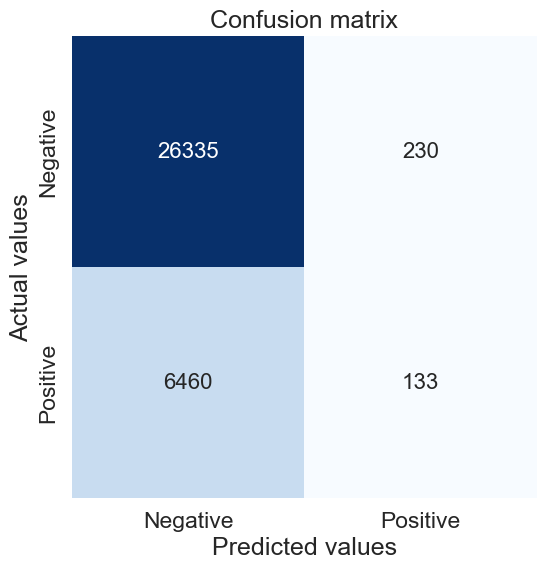

In [73]:
# Plot confusion matrix
plot_confusion_matrix(cnf_matrix, title="Confusion matrix")

In [74]:
# Plot ROC Curve
plot_roc_curve(x_test, y_test, lr)

# Decision tree classifier

In [89]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics

In [165]:
# Create Decision Tree classifer object
dt = DecisionTreeClassifier()

# Train Decision Tree Classifer
dt = dt.fit(x_train,y_train)

#Predict the response for test dataset
y_hat = dt.predict(x_test)

In [166]:
# Model Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_hat))

Accuracy: 0.7857229024669763


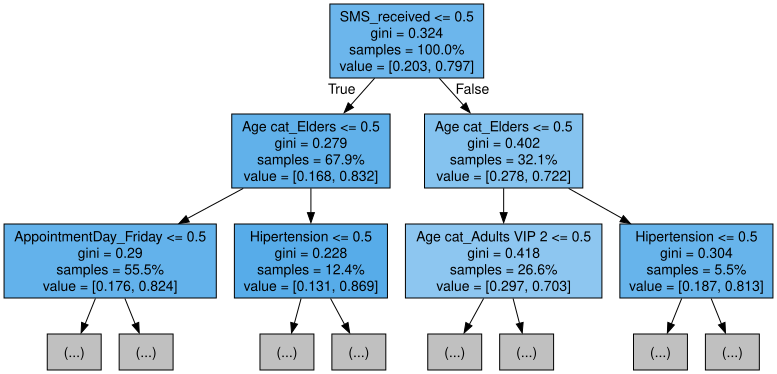

In [167]:
# Visualize tree
dot_data = export_graphviz(dt,
                           feature_names = x_train.columns,
                           filled = True,
                           max_depth=2,
                           impurity=True,
                           proportion = True)
graph = graphviz.Source(dot_data)
display(graph)

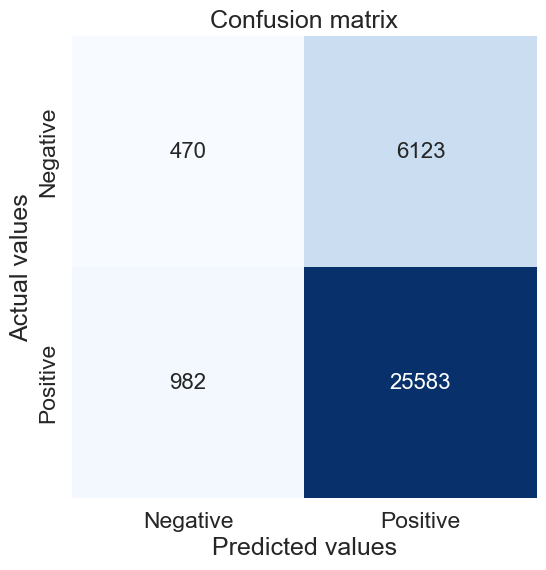

In [168]:
# Confusion Matrix
cnf_matrix = confusion_matrix(y_test, y_hat, labels=[0,1])

# Plot confusion matrix
plot_confusion_matrix(cnf_matrix, title="Confusion matrix")

# Plot ROC Curve
plot_roc_curve(x_test, y_test, dt)

## Optimise Decision tree

In [113]:
from sklearn.model_selection import GridSearchCV

In [171]:
parameters = {'criterion':['gini','entropy','log_loss'], 'max_depth':[3,4,5,6,None]}
dt = DecisionTreeClassifier(class_weight="balanced")
clf = GridSearchCV(dt, parameters, cv=5)

clf.fit(x_train, y_train)

print("Best estimator : ", clf.best_estimator_)
print("Best_score : ", clf.best_score_)
print("Best parameters : ", clf.best_params_)

grid_results = pd.DataFrame(clf.cv_results_)

Best estimator :  DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=4)
Best_score :  0.6616433963639907
Best parameters :  {'criterion': 'entropy', 'max_depth': 4}


In [172]:
# Create Decision Tree classifer object
#dt = DecisionTreeClassifier(criterion="gini", max_depth=3)
dt = DecisionTreeClassifier(class_weight="balanced",criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
dt = dt.fit(x_train,y_train)

#Predict the response for test dataset
y_hat = dt.predict(x_test)

# Model Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_hat))

Accuracy: 0.6576994993666687


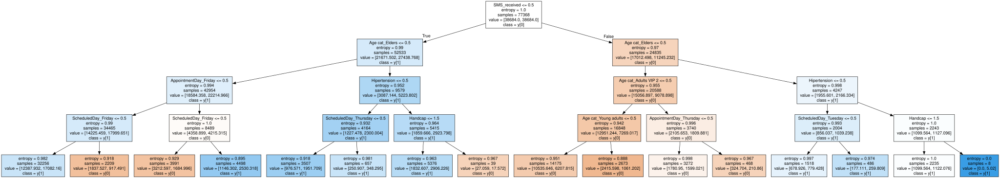

In [180]:
# Visualize tree
dot_data = export_graphviz(dt,
                           feature_names = x_train.columns,
                           filled = True,
                           impurity=True,
                           proportion = False,
                           class_names = True,
                           leaves_parallel = True)
graph = graphviz.Source(dot_data)
display(graph)

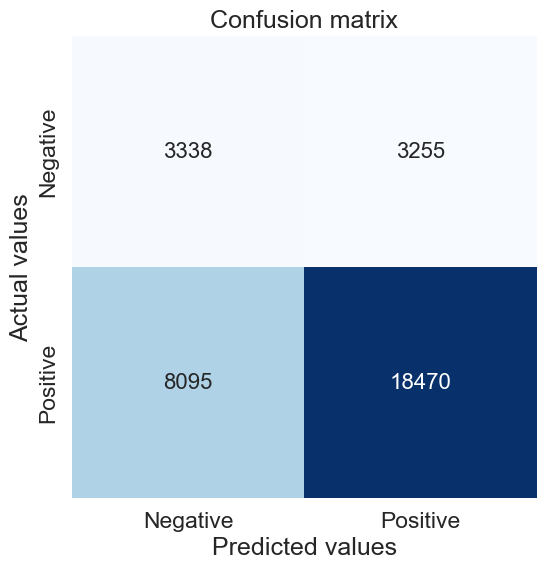

In [164]:
# Confusion Matrix
cnf_matrix = confusion_matrix(y_test, y_hat, labels=[0,1])

# Plot confusion matrix
plot_confusion_matrix(cnf_matrix, title="Confusion matrix")

# Plot ROC Curve
plot_roc_curve(x_test, y_test, dt)